# Part 1: Vision Transformer (ViT)

Reference: [AN IMAGE IS WORTH 16X16 WORDS:
TRANSFORMERS FOR IMAGE RECOGNITION AT SCALE
](http://arxiv.org/pdf/2010.11929)

## What is ViT?

* A type of NN architecture that applies the Transformer model to computer vision tasks.

## Why use ViTs?
* Captures global relationships between image patches via self-attention mechanism
* Low Inductive Bias unlike CNNS [ Its Receptive field starting from local view gets larger and wider over the layers, Hence alot of guidance is given to the model ]
* Leads to SOTA performance on large dataset

## How do they work?

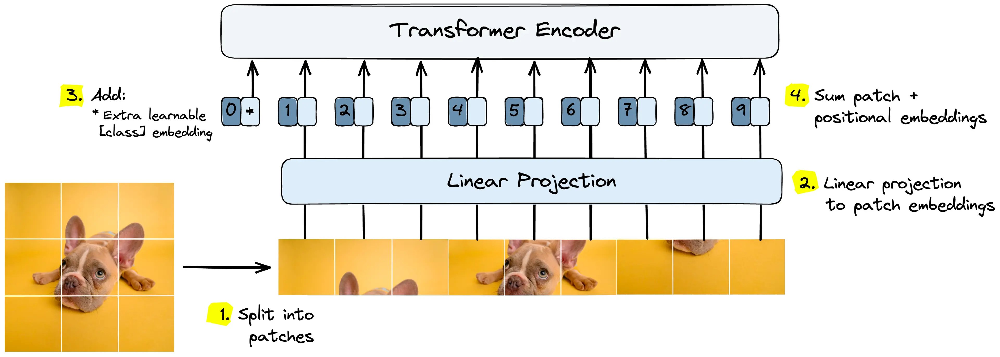
[Source](https://www.pinecone.io/_next/image/?url=https%3A%2F%2Fcdn.sanity.io%2Fimages%2Fvr8gru94%2Fproduction%2F7a096efc8f3cc40849ee17a546dc0e685da2dc73-4237x1515.png&w=3840&q=75)

1. Splitting Image into Patches to get 16x16 pixel patches
2. Embedding Patches which processes through linear projection
3. A trainable [Class] Embedding is appended to patch embedding
4. Making predictions using a special classification token.
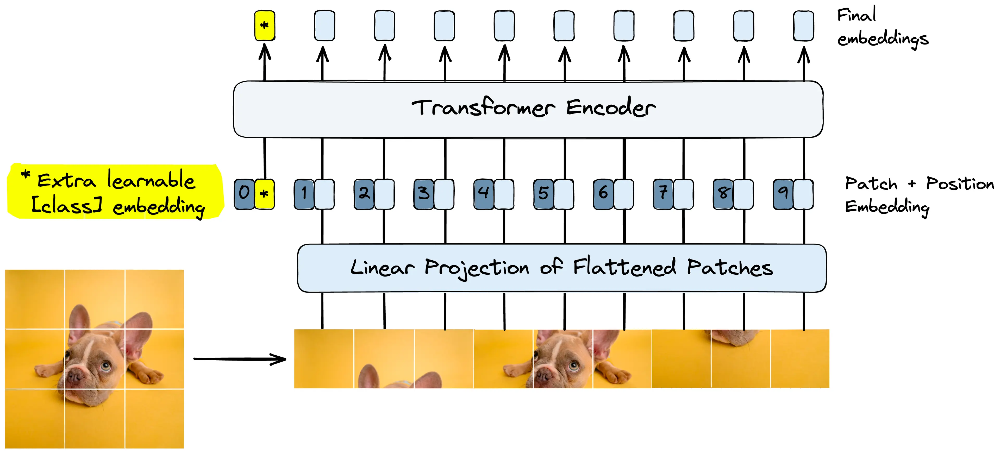
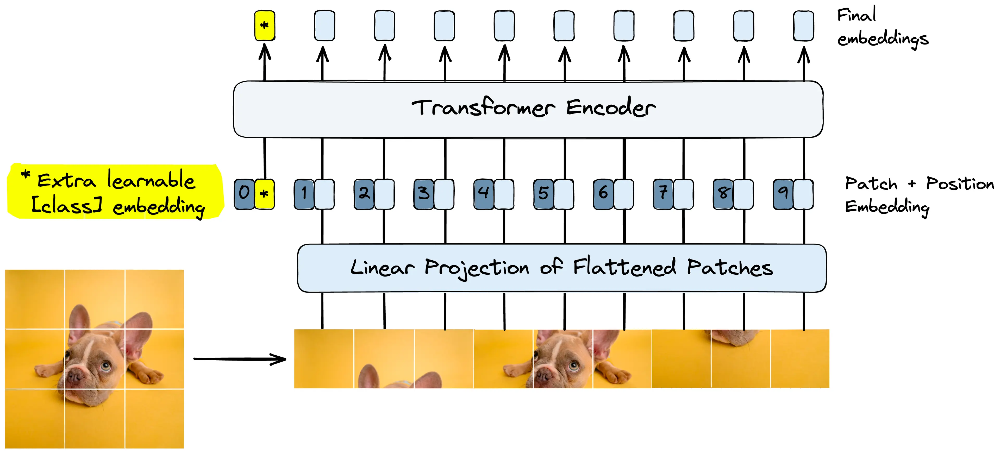
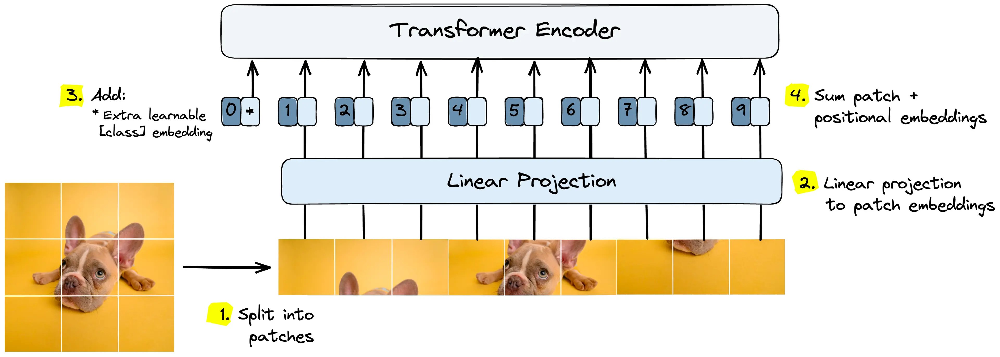

# Code Along

## Setup the environment 

In [12]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import timm
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import json


## Loading pre-trained ViT Model

In [ ]:
model = timm.create_model('vit_base_patch16_224', pretrained=True)
model.eval()  # Set the model to evaluation mode


## Image Preprocessing

This step handles: 

* Resizing the image to the model expected input
* Converting image to tensor
* Normalising pixel values to keep in range that the model expects


In [7]:
preprocessor = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5,0.5,0.5],  std=[0.5, 0.5, 0.5])
])

## Downloading and Displaying an Example Image

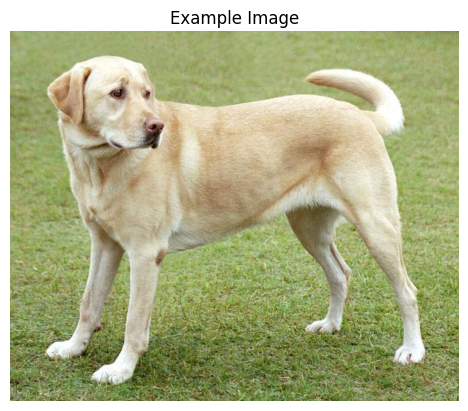

In [8]:
image_url = 'https://upload.wikimedia.org/wikipedia/commons/2/26/YellowLabradorLooking_new.jpg'
response = requests.get(image_url)
img = Image.open(BytesIO(response.content))

# Display the image
plt.imshow(img)
plt.axis('off')  # Turn off axis numbers and ticks
plt.title("Example Image")
plt.show()


## Preprocess and Prediction

In [10]:
# Preprocess the image
img_tensor = preprocessor(img)
img_tensor = img_tensor.unsqueeze(0)  # Add a batch dimension (required by the model)

# Run the image through the model
with torch.no_grad():
    outputs = model(img_tensor)

# ImageNet class labels to interpret predictions
labels_url = 'https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json'
labels_response = requests.get(labels_url)
labels = json.loads(labels_response.text)

# Get the predicted class
predicted_class = labels[outputs.argmax().item()]
print("Predicted class:", predicted_class)


Predicted class: Labrador Retriever


# Part 2: SWIN Transformer

Reference: [Swin Transformer: Hierarchical Vision Transformer using Shifted Windows](https://arxiv.org/pdf/2103.14030)

## What is SWIN Transformer

Shifted Window Tranformer is type of ViT that builds hierarchical feature maps using local self-attention in non-overlapping windows, with a clever mechanism of shifting the windows between layers.

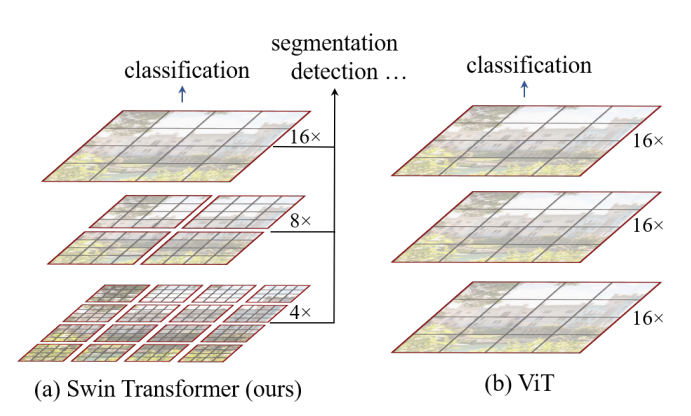

**SWIN Introduces two main innovations:**

## Shifted-Window based Self-Attention:
Instead of performing self-attention over the entire image (or its patch sequence), SWIN Transformer divides the image into small, non-overlapping windows and computes self-attention within each window. This significantly reduces computational cost.

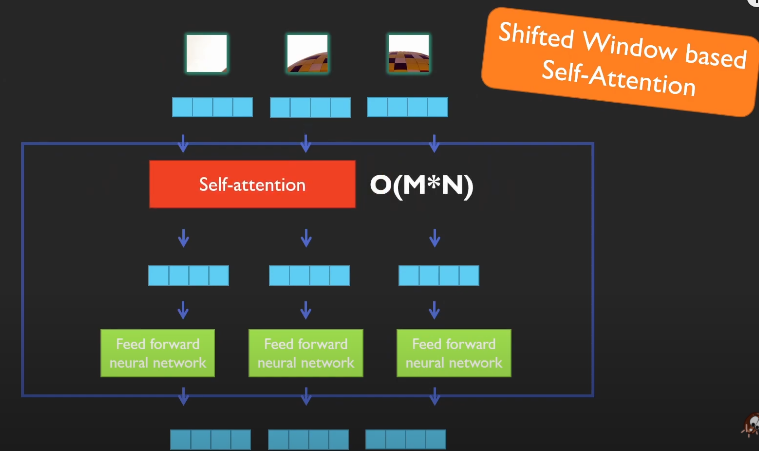
[Source](https://www.youtube.com/watch?v=SndHALawoag)
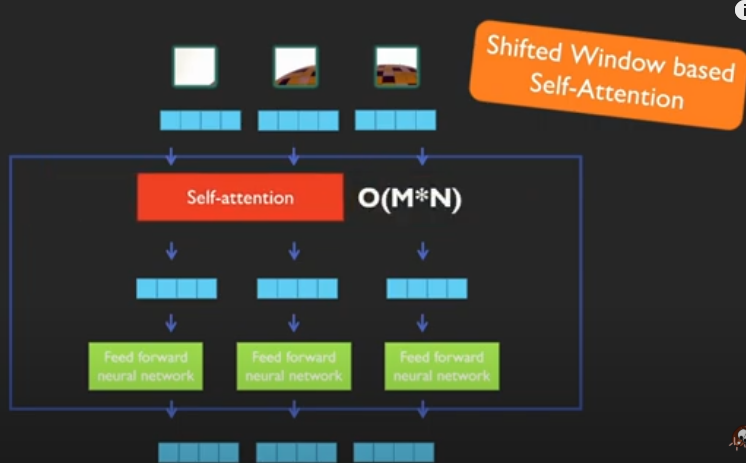

## Shifted Window
To enable cross-window information flow, the windows are shifted between consecutive layers. This means that while one layer processes fixed windows, the next layer shifts the window boundaries so that patches near the border of one window are grouped with patches from neighboring windows. This clever idea helps to capture global relationships without the heavy cost of full attention.

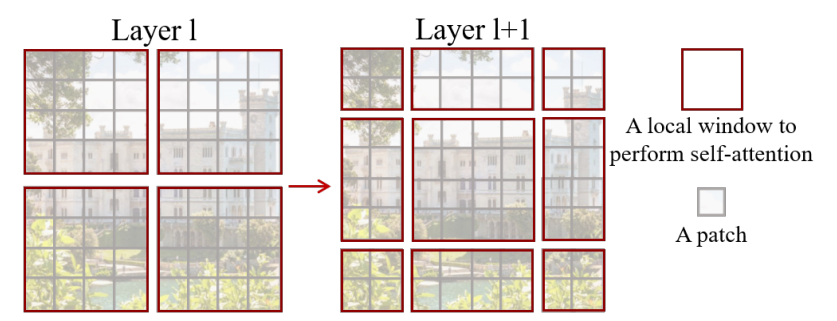
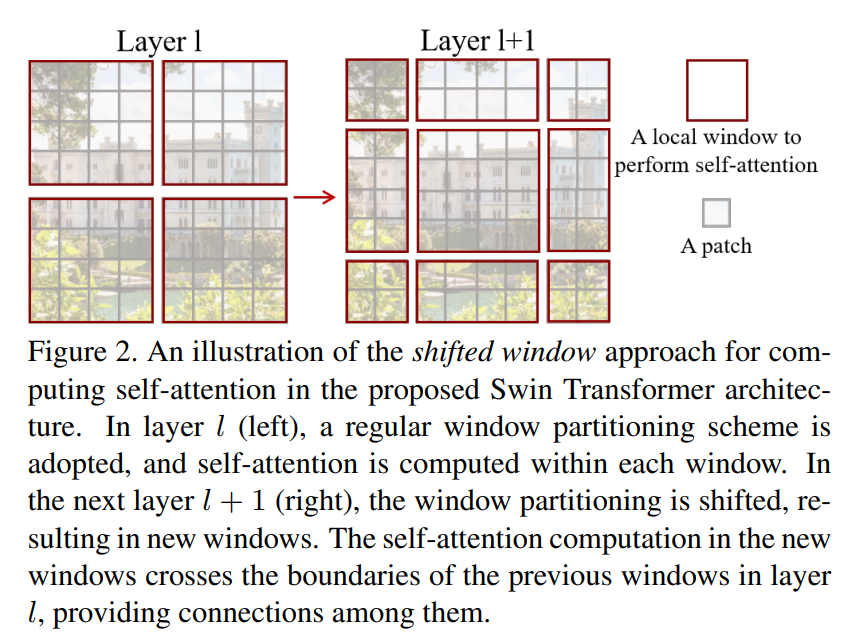

## Why use SWIN Transformer?
* Efficiency: The local window approach greatly reduces the quadratic complexity typical of standard self-attention.
* Scalability: The hierarchical architecture allows SWIN to work with high-resolution images by progressively merging patches, similar to how CNNs work.
* Flexibility: Its design is well-suited not just for image classification, but also for detection, segmentation, and other dense prediction tasks.

# Code Along

## Setup & Load pretrained swin transformer model

In [1]:
# Import required libraries
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from PIL import Image
import timm
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import json
import numpy as np
import cv2  # For blending overlays


## Loading the pretrained SWIN Transformer

In [2]:
# Load a pre-trained SWIN Transformer model from timm
model_name = "swin_base_patch4_window7_224"  # You can try other variants like swin_tiny
model = timm.create_model(model_name, pretrained=True)
model.eval()  # Set to evaluation mode
for info in model.feature_info:
    print(info)

model.safetensors:   0%|          | 0.00/353M [00:00<?, ?B/s]

{'num_chs': 128, 'reduction': 4, 'module': 'layers.0'}
{'num_chs': 256, 'reduction': 8, 'module': 'layers.1'}
{'num_chs': 512, 'reduction': 16, 'module': 'layers.2'}
{'num_chs': 1024, 'reduction': 32, 'module': 'layers.3'}


## Image preprocessing of Example Image

In [3]:
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to match the input size
    transforms.ToTensor(),          # Convert image to tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])


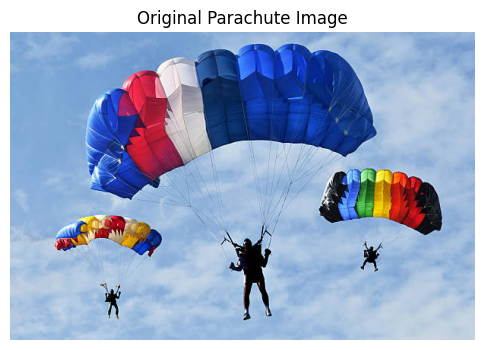

In [4]:
# Download an example parachute image featuring people
image_url = 'https://media.istockphoto.com/id/153503499/photo/three-parachutes.jpg?s=612x612&w=0&k=20&c=Cn6msiRPuJ2jzOzfze3UQElzghQF2ypZKnmFhyLCTZE='
response = requests.get(image_url)
img = Image.open(BytesIO(response.content))

# Display the original image
plt.figure(figsize=(6, 6))
plt.imshow(img)
plt.axis('off')
plt.title("Original Parachute Image")
plt.show()


## Runnning model

In [6]:
# Preprocess the image and add a batch dimension
img_tensor = preprocess(img)
img_tensor = img_tensor.unsqueeze(0)  # Shape: [1, 3, 224, 224]

# Run the image through the model
with torch.no_grad():
    model_output = model(img_tensor)


In [7]:
# Load ImageNet class labels
labels_url = "https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json"
labels_response = requests.get(labels_url)
labels = json.loads(labels_response.text)

# Get the predicted class label
predicted_class = labels[model_output.argmax().item()]
print("Predicted class:", predicted_class)

Predicted class: parachute
